<a href="https://colab.research.google.com/github/GDharan10/Project5_IndustrialCopperModeling/blob/main/IndustrialCopperModeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Librarys**

In [1]:
import pandas as pd
import numpy as np
from google.colab import drive
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder

from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error, r2_score # Regression
from sklearn.metrics import accuracy_score, top_k_accuracy_score, precision_score, recall_score, f1_score, roc_auc_score # Classification

In [2]:
from joblib import dump

In [3]:
#Google drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Data Understanding**

In [4]:
file_path = '/content/drive/My Drive/DTM15/Dataset/Copper_Set.xlsx - Result 1.csv'
df = pd.read_csv(file_path)

<ipython-input-4-833bd3c91857>:2: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [5]:
df.head()

,id,item_date,quantity tons,customer,country,status,item type,application,thickness,width,material_ref,product_ref,delivery date,selling_price
0,EC06F063-9DF0-440C-8764-0B0C05A4F6AE,20210401.0,54.151139,30156308.0,28.0,Won,W,10.0,2.00,1500.0,DEQ1 S460MC,1670798778,20210701.0,854.00
1,4E5F4B3D-DDDF-499D-AFDE-A3227EC49425,20210401.0,768.024839,30202938.0,25.0,Won,W,41.0,0.80,1210.0,0000000000000000000000000000000000104991,1668701718,20210401.0,1047.00
2,E140FF1B-2407-4C02-A0DD-780A093B1158,20210401.0,386.127949,30153963.0,30.0,Won,WI,28.0,0.38,952.0,S0380700,628377,20210101.0,644.33
3,F8D507A0-9C62-4EFE-831E-33E1DA53BB50,20210401.0,202.411065,30349574.0,32.0,Won,S,59.0,2.30,1317.0,DX51D+ZM310MAO 2.3X1317,1668701718,20210101.0,768.00
4,4E1C4E78-152B-430A-8094-ADD889C9D0AD,20210401.0,785.526262,30211560.0,28.0,Won,W,10.0,4.00,2000.0,2_S275JR+AR-CL1,640665,20210301.0,577.00


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181673 entries, 0 to 181672
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             181671 non-null  object 
 1   item_date      181672 non-null  float64
 2   quantity tons  181673 non-null  object 
 3   customer       181672 non-null  float64
 4   country        181645 non-null  float64
 5   status         181671 non-null  object 
 6   item type      181673 non-null  object 
 7   application    181649 non-null  float64
 8   thickness      181672 non-null  float64
 9   width          181673 non-null  float64
 10  material_ref   103754 non-null  object 
 11  product_ref    181673 non-null  int64  
 12  delivery date  181672 non-null  float64
 13  selling_price  181672 non-null  float64
dtypes: float64(8), int64(1), object(5)
memory usage: 19.4+ MB


In [7]:
df.isnull().sum()

id                   2
item_date            1
quantity tons        0
customer             1
country             28
status               2
item type            0
application         24
thickness            1
width                0
material_ref     77919
product_ref          0
delivery date        1
selling_price        1
dtype: int64

# **Data Preprocessing**

In [8]:
df.drop(['id'], axis = 1, inplace=True)

**item_date**

In [9]:
df['item_date'].unique()

array([20210401., 19950000., 20210331., 20210330., 20210329., 20210328.,
       20210327., 20210326., 20210325., 20210324., 20210323., 20210322.,
       20210319., 20210318., 20210317., 20210316., 20210315., 20210314.,
       20210313., 20210312., 20210311., 20210310., 20210309., 20210308.,
       20210307., 20210306., 20210305., 20210304., 20210303., 20210302.,
       20210301., 20210228., 20210227., 20210226., 20210225., 20210224.,
       20210223., 20210222., 20210221., 20210220., 20210219., 20210218.,
       20210217., 20210216., 20210215., 20210214., 20210213., 20210212.,
       20210211., 20210210., 20210209., 20210208., 20210207., 20210205.,
       20210204., 20210203., 20210202., 20210201., 20210131., 20210130.,
       20210129., 20210128., 20210127., 20210126., 20210125., 20210124.,
       20210122., 20210121., 20210120., 20210119., 20210118., 20210117.,
       20210116., 20210115., 20210114., 20210113., 20210112., 20210111.,
       20210110., 20210109., 20210108., 20210107., 

In [10]:
df['item_date'].fillna(method='bfill', inplace=True)

In [11]:
df.drop(df[df['item_date'].isin([19950000.0, 20191919.0])].index, inplace=True)

In [12]:
df['item_date'] = pd.to_datetime(df['item_date'], format='%Y%m%d')

In [13]:
df['item_date'].head()

0   2021-04-01
1   2021-04-01
2   2021-04-01
3   2021-04-01
4   2021-04-01
Name: item_date, dtype: datetime64[ns]

**quantity tons**

In [14]:
df['quantity tons'].unique()

array([54.15113862, 768.0248392, 386.1279489, ..., '4.235593568', '-2000',
       '406.6865384'], dtype=object)

In [15]:
df['quantity tons'].value_counts().sum()

181671

In [16]:
df.drop(df[df['quantity tons']=='e'].index, inplace=True)

In [17]:
df['quantity tons'] = df['quantity tons'].astype(float)

In [18]:
df['quantity tons'].max()

1000000000.0

In [19]:
df[df['quantity tons'] <= 0]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,material_ref,product_ref,delivery date,selling_price
105730,2020-11-11,-4.000000,30203192.0,27.0,Won,S,15.0,1.50,1500.0,NaN,1332077137,20210101.0,723.0
131473,2020-10-02,-1.476794,30199273.0,27.0,Draft,S,10.0,0.60,1220.0,0000000000000000000000000000000000111598,611993,20210101.0,22.0
181661,2020-07-02,-18.000000,30200854.0,25.0,Won,W,41.0,0.84,1220.0,0000000000000000000000000000000001000776,164141591,20200701.0,590.0
181671,2020-07-02,-2000.000000,30200854.0,25.0,Won,W,41.0,0.85,1250.0,0000000000000000000000000000000001001149,164141591,20200701.0,601.0


In [20]:
df['quantity tons'].min()

-2000.0

In [21]:
fig = px.box(df, y='quantity tons', title='Boxplot of Quantity (Tons)')
fig.show()

In [22]:
len(df[df['quantity tons'] > 151.4395]), len(df[df['quantity tons'] < 1e-05])

(20955, 4)

In [23]:
df['quantity tons'] = df['quantity tons'].clip(upper=151.4395, lower=1e-05)

In [24]:
fig = px.box(df, y='quantity tons', title='Boxplot of Quantity (Tons)')
fig.show()

**customer**

In [25]:
df.dropna(subset=['customer'], inplace=True)

**country**

In [26]:
df.country.unique()

array([ 28.,  25.,  30.,  32.,  38.,  78.,  27.,  77., 113.,  79.,  26.,
        39.,  40.,  84.,  80., 107.,  89.,  nan])

In [27]:
df.dropna(subset=['country'], inplace=True)

**status**

In [28]:
df.status.unique()

array(['Won', 'Draft', 'To be approved', 'Lost', 'Not lost for AM',
       'Wonderful', 'Revised', 'Offered', 'Offerable', nan], dtype=object)

In [29]:
df.dropna(subset=['status'], inplace=True)

**item type**

In [30]:
df["item type"].unique()

array(['W', 'WI', 'S', 'Others', 'PL', 'IPL', 'SLAWR'], dtype=object)

**application**

In [31]:
df["application"].unique()

array([10., 41., 28., 59., 15.,  4., 38., 56., 42., 26., 27., 19., 20.,
       66., 29., 22., 40., 25., 67., 79.,  3., 99.,  2.,  5., 39., 69.,
       70., 65., 58., 68.])

**thickness**

In [32]:
df['thickness'].max()

2500.0

In [33]:
fig = px.box(df, y='thickness', title='Boxplot of thickness')
fig.show()

In [34]:
len(df[df['thickness'] > 6.45]), len(df[df['thickness'] < 0.18])

(13945, 0)

In [35]:
df['thickness'] = df['thickness'].clip(upper=6.45, lower=0.18)

In [36]:
fig = px.box(df, y='thickness', title='Boxplot of thickness')
fig.show()

In [37]:
df['thickness'].fillna(1.5, inplace=True)

**width**

In [38]:
fig = px.box(df, y='width', title='Boxplot of width')
fig.show()

In [39]:
len(df[df['width'] > 1980]), len(df[df['width'] < 700])

(8981, 1967)

In [40]:
df['width'] = df['width'].clip(upper=1980, lower=700)

In [41]:
fig = px.box(df, y='width', title='Boxplot of width')
fig.show()

**material_ref**

In [42]:
df.drop("material_ref", axis = 1, inplace = True)

**product_ref**

In [43]:
df.product_ref.unique()

array([1670798778, 1668701718,     628377,     640665,     611993,
       1668701376,  164141591, 1671863738, 1332077137,     640405,
       1693867550, 1665572374, 1282007633, 1668701698,     628117,
       1690738206,     628112,     640400, 1671876026,  164336407,
        164337175, 1668701725, 1665572032,     611728, 1721130331,
       1693867563,     611733, 1690738219, 1722207579,  929423819,
       1665584320, 1665584662, 1665584642])

**delivery date**

In [44]:
df["delivery date"].unique()

array([20210701., 20210401., 20210101., 20210301., 20210601., 20210501.,
       20210801., 30310101., 20210901., 20211001., 20211101., 20220101.,
       20200701., 20201001., 20200101., 20210201., 20211201., 20190701.,
       20200801., 20201101., 20201201., 20190401., 20200601., 20200401.,
       20200901., 20200501.,       nan, 20212222., 20191001.])

In [45]:
df[df["delivery date"]==30310101.]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price
58,2021-04-01,13.63477,30271717.0,28.0,To be approved,W,10.0,0.6,1250.0,611993,30310101.0,1266.0


In [46]:
df.loc[df["delivery date"] == 30310101, "delivery date"] = 20210101

In [47]:
df[df["delivery date"]==20212222.]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price
105421,2020-11-12,30.714021,30350566.0,28.0,Won,S,70.0,0.6,1250.0,611993,20212222.0,825.0


In [48]:
df.loc[df["delivery date"] == 20212222, "delivery date"] = 20201222

In [49]:
df[df["delivery date"].isnull()]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price
104761,2020-11-12,100.229137,30349338.0,26.0,Won,S,10.0,1.0,1300.0,611993,NaN,1005.0


In [50]:
df['delivery date'].fillna(20201222, inplace=True)

In [51]:
df['delivery date'] = pd.to_datetime(df['delivery date'], format='%Y%m%d')

**selling_price**

In [52]:
df.dropna(subset=['selling_price'], inplace=True)

In [53]:
df['selling_price'].describe()

count    1.816380e+05
mean     1.918327e+03
std      3.318267e+05
min     -1.160000e+03
25%      6.690000e+02
50%      8.120000e+02
75%      9.530000e+02
max      1.000010e+08
Name: selling_price, dtype: float64

In [54]:
df['selling_price'].max()

100001015.0

In [55]:
df[df['selling_price'] >= 2500]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price
10228,2021-03-18,43.806254,30353306.0,107.0,To be approved,S,56.0,0.40,1254.0,1721130331,2021-01-01,1.000009e+08
36192,2021-02-19,8.676803,30217607.0,27.0,Not lost for AM,PL,10.0,0.60,1446.0,164141591,2021-05-01,1.000010e+08
76871,2020-12-15,17.995508,30157111.0,78.0,Won,W,41.0,1.15,1500.0,611993,2021-03-01,8.166000e+03
113918,2020-10-28,4.774096,30157111.0,78.0,Won,W,41.0,1.15,1500.0,611993,2020-12-01,8.062000e+03
116445,2020-10-26,20.114277,30157111.0,78.0,Not lost for AM,W,41.0,1.15,1500.0,611993,2020-12-01,8.062000e+03
123570,2020-10-14,1.792484,30229766.0,84.0,Won,W,41.0,0.50,1250.0,611993,2020-10-01,8.123614e+04
124547,2020-10-13,9.509518,30205658.0,32.0,Won,W,10.0,0.75,1000.0,611993,2021-01-01,1.091300e+04
141122,2020-09-18,7.712359,30157111.0,78.0,Won,W,41.0,1.15,1500.0,611993,2020-10-01,8.032000e+03
153215,2020-08-28,84.282044,30157111.0,78.0,Won,W,41.0,0.50,1050.0,611993,2020-07-01,8.748000e+03
159869,2020-08-10,48.972675,30157111.0,78.0,Not lost for AM,W,41.0,0.50,1050.0,611993,2020-10-01,8.791000e+03


In [56]:
df[df['selling_price'] <= 0]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price
28,2021-04-01,99.059199,30153510.0,30.0,Won,W,41.0,0.595,1207.0,611993,2021-04-01,-1160.0
41,2021-04-01,59.907355,30202938.0,25.0,Won,W,41.0,6.450,1260.0,1670798778,2021-04-01,0.0
44761,2021-02-04,101.397995,30198657.0,32.0,Won,W,41.0,1.250,1100.0,1721130331,2021-04-01,-730.0
44810,2021-02-03,12.225889,30157111.0,78.0,Won,W,41.0,0.750,1250.0,164141591,2021-04-01,-445.0
44865,2021-02-03,28.368563,30217604.0,27.0,Not lost for AM,PL,10.0,1.500,1270.0,164141591,2021-05-01,-25.0
45358,2021-02-03,37.655706,30201046.0,26.0,Not lost for AM,W,59.0,2.000,1300.0,1670798778,2021-07-01,0.0
105189,2020-11-12,5.280274,30209814.0,25.0,Won,W,15.0,6.000,1250.0,1671863738,2021-02-01,-336.0


In [57]:
fig = px.box(df, y='selling_price', title='Boxplot of selling_price')
fig.show()

In [58]:
len(df[df['selling_price'] > 1379]), len(df[df['selling_price'] < 250])

(1726, 3132)

In [59]:
df['selling_price'] = df['selling_price'].clip(upper=1379, lower=250)

In [60]:
fig = px.box(df, y='selling_price', title='Boxplot of selling_price')
fig.show()

# **Feature Engineering**

In [61]:
df['duration days'] = (df['delivery date'] - df['item_date']).dt.days
df['duration days']

0         91
1          0
2        -90
3        -90
4        -31
          ..
181668    -1
181669    -1
181670    -1
181671    -1
181672    -1
Name: duration days, Length: 181638, dtype: int64

In [62]:
df[df['duration days']<0]

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price,duration days
2,2021-04-01,151.439500,30153963.0,30.0,Won,WI,28.0,0.38,952.0,628377,2021-01-01,644.33,-90
3,2021-04-01,151.439500,30349574.0,32.0,Won,S,59.0,2.30,1317.0,1668701718,2021-01-01,768.00,-90
4,2021-04-01,151.439500,30211560.0,28.0,Won,W,10.0,4.00,1980.0,640665,2021-03-01,577.00,-31
7,2021-04-01,113.387124,30342192.0,32.0,Won,W,41.0,0.68,1220.0,611993,2021-01-01,931.00,-90
11,2021-04-01,113.995666,30342192.0,32.0,Won,W,41.0,0.55,1220.0,611993,2021-01-01,954.00,-90
...,...,...,...,...,...,...,...,...,...,...,...,...,...
181668,2020-07-02,102.482422,30200854.0,25.0,Won,W,41.0,0.96,1220.0,164141591,2020-07-01,591.00,-1
181669,2020-07-02,151.439500,30200854.0,25.0,Won,W,41.0,0.95,1500.0,164141591,2020-07-01,589.00,-1
181670,2020-07-02,4.235594,30200854.0,25.0,Won,W,41.0,0.71,1250.0,164141591,2020-07-01,619.00,-1
181671,2020-07-02,0.000010,30200854.0,25.0,Won,W,41.0,0.85,1250.0,164141591,2020-07-01,601.00,-1


In [ ]:
df1 = df.copy()

In [ ]:
df1.drop(df1[~df1['status'].isin(['Won', 'Lost'])].index, inplace=True)

In [ ]:
df1['status'].value_counts()

status
Won     116007
Lost     34432
Name: count, dtype: int64

# **EDA**

In [ ]:
def plot(df, column):
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    sns.boxplot(data=df, x=column)
    plt.title(f'Box Plot for {column}')

    plt.subplot(1,3,2)
    sns.histplot(data=df, x=column, kde=True, bins=50)
    plt.title(f'Distribution Plot for {column}')

    plt.subplot(1,3,3)
    sns.violinplot(data=df, x=column)
    plt.title(f'Violin Plot for {column}')
    plt.show()

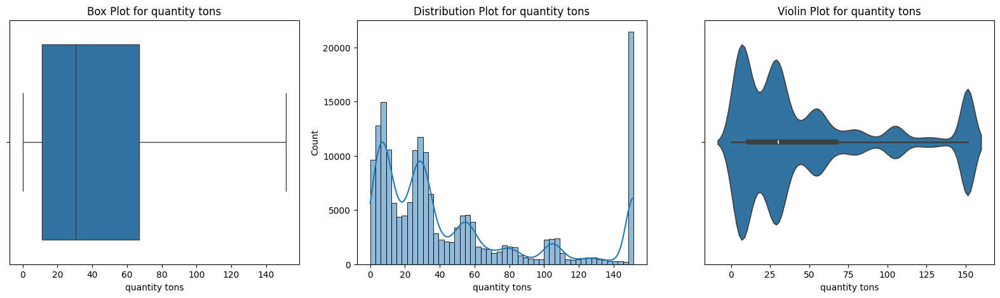

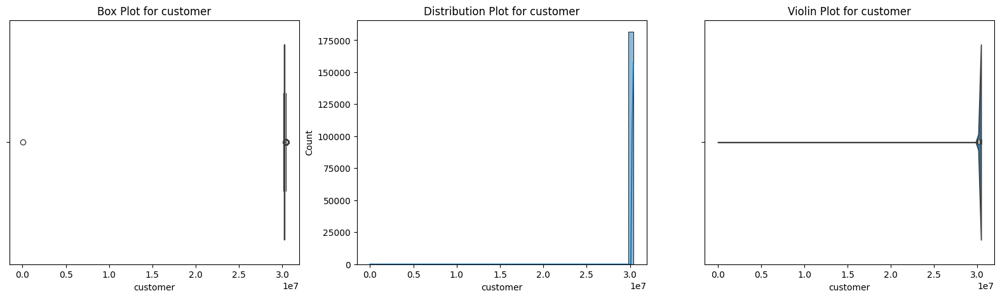

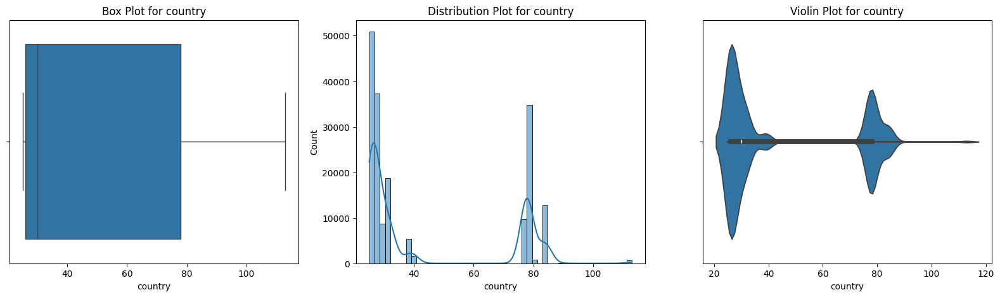

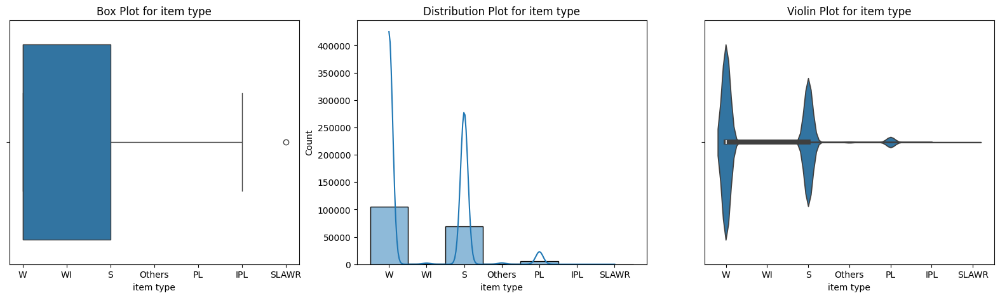

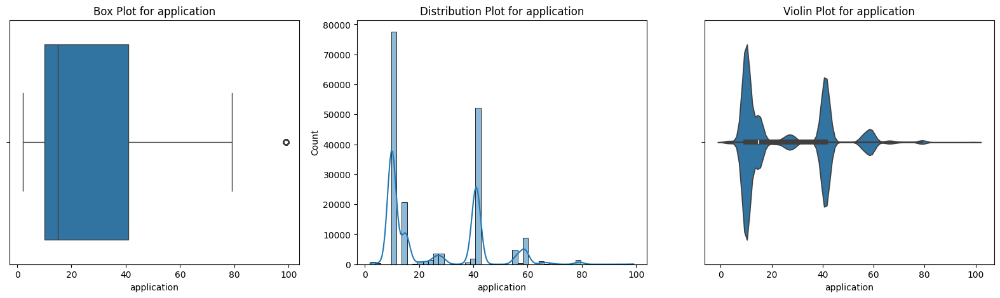

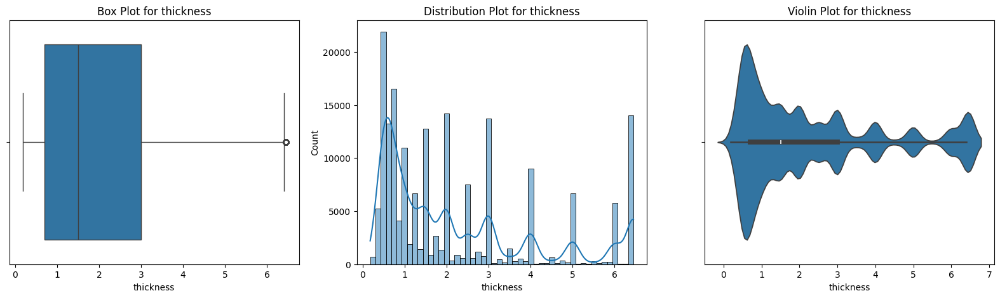

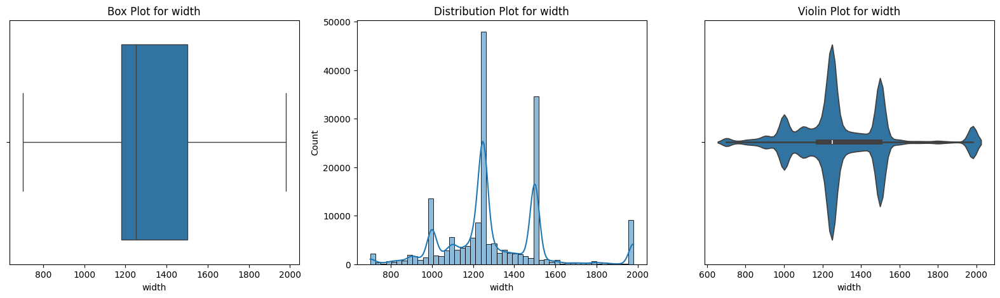

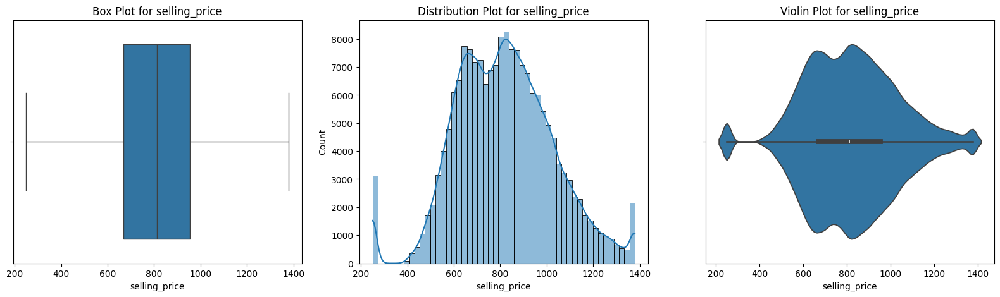

In [ ]:
for i in ['quantity tons', 'customer', 'country', 'item type', 'application', 'thickness', 'width', 'selling_price']:
    plot(df, i)

# **Model Building and Evaluation**

**selling_price**

In [ ]:
df["status"] = df["status"].map({'Won': 1, 'Draft': 7, 'To be approved': 6, 'Lost': 0, 'Not lost for AM': 2, 'Wonderful': 8, 'Revised': 5, 'Offered': 4, 'Offerable': 3})
df["item type"] = df["item type"].map({'W': 5, 'WI': 6, 'S': 3, 'Others': 1, 'PL': 2, 'IPL': 0, 'SLAWR': 4})

In [ ]:
#df.to_csv('sellingPricePredection.csv', index=False)

In [ ]:
selling_price_x=df.drop(["selling_price", 'item_date', 'delivery date'],axis=1)
selling_price_y=df["selling_price"]

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(selling_price_x,selling_price_y,test_size=0.25)

In [ ]:
from sklearn.tree import DecisionTreeRegressor
DTR_model=DecisionTreeRegressor().fit(x_train,y_train)
DTR_y_pred=DTR_model.predict(x_test)

In [ ]:
mse = mean_squared_error(y_test, DTR_y_pred)
r2 = r2_score(y_test, DTR_y_pred)

mse, r2

(6047.325408274471, 0.861854937726708)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
RF_model=RandomForestRegressor().fit(x_train,y_train)
RF_y_pred=RF_model.predict(x_test)

In [ ]:
mse = mean_squared_error(y_test, RF_y_pred)
r2 = r2_score(y_test, RF_y_pred)

mse, r2

(3317.608532330965, 0.9242125722769664)

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
KNN_model=KNeighborsRegressor().fit(x_train,y_train)
KNN_y_pred=KNN_model.predict(x_test)

In [ ]:
mse = mean_squared_error(y_test, KNN_y_pred)
r2 = r2_score(y_test, KNN_y_pred)

mse, r2

(11411.695832008103, 0.7393112946758965)

In [ ]:
dump(RF_model, 'selling_price_model.pkl')

**status**

In [ ]:
df1["status"] = df1["status"].map({'Won': 1, 'Lost': 0})
df1["item type"] = df1["item type"].map({'W': 5, 'WI': 6, 'S': 3, 'Others': 1, 'PL': 2, 'IPL': 0, 'SLAWR': 4})

In [ ]:
status_x=df1.drop(["status", 'item_date', 'delivery date'],axis=1)
status_y=df1["status"]

In [ ]:
status_y.unique()

array([1, 0])

In [ ]:
status_x_train,status_x_test,status_y_train,status_y_test=train_test_split(status_x,status_y,test_size=0.25)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
GB_model=GradientBoostingClassifier().fit(status_x_train,status_y_train)
GB_y_pred=GB_model.predict(status_x_test)

In [ ]:
a = accuracy_score(status_y_test, GB_y_pred)
ps = precision_score(status_y_test, GB_y_pred)
rs = recall_score(status_y_test, GB_y_pred)
f1 = f1_score(status_y_test, GB_y_pred)
auc = roc_auc_score(status_y_test, GB_y_pred)

a, ps, rs, f1, auc

(0.8364796596649827,
 0.8489788442165034,
 0.9585358287664151,
 0.9004371053909666,
 0.6915512690418093)

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
ET_model=ExtraTreesClassifier().fit(status_x_train,status_y_train)
ET_y_pred=ET_model.predict(status_x_test)

In [ ]:
a = accuracy_score(status_y_test, ET_y_pred)
ps = precision_score(status_y_test, ET_y_pred)
rs = recall_score(status_y_test, ET_y_pred)
f1 = f1_score(status_y_test, ET_y_pred)
auc = roc_auc_score(status_y_test, ET_y_pred)

a, ps, rs, f1, auc

(0.960648763626695,
 0.971988891555525,
 0.9771481749560542,
 0.9745617050532829,
 0.9410575119284168)

In [ ]:
from sklearn.svm import SVC
SVC_model=SVC().fit(status_x_train,status_y_train)
SVC_y_pred=SVC_model.predict(status_x_test)

In [ ]:
a = accuracy_score(status_y_test, SVC_y_pred)
ps = precision_score(status_y_test, SVC_y_pred)
rs = recall_score(status_y_test, SVC_y_pred)
f1 = f1_score(status_y_test, SVC_y_pred)
auc = roc_auc_score(status_y_test, SVC_y_pred)

a, ps, rs, f1, auc

(0.7714171762829035, 0.7714171762829035, 1.0, 0.8709604791138196, 0.5)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DTC_model=DecisionTreeClassifier().fit(status_x_train,status_y_train)
DTC_y_pred=DTC_model.predict(status_x_test)

In [ ]:
a = accuracy_score(status_y_test, DTC_y_pred)
ps = precision_score(status_y_test, DTC_y_pred)
rs = recall_score(status_y_test, DTC_y_pred)
f1 = f1_score(status_y_test, DTC_y_pred)
auc = roc_auc_score(status_y_test, DTC_y_pred)

a, ps, rs, f1, auc

(0.9487370380218028,
 0.9665483859854618,
 0.9670147864750285,
 0.9667815299793245,
 0.9270342049160067)

In [ ]:
with open('status_model.pkl', 'wb') as file:
    pickle.dump(ET_model, file)